# О работе

Эта лабораторная работа направлена на изучение базовых алгоритмов классификации с использыванием библиотеки scikit-learn.

Предложено ознакомиться с работой таких классификаторов, как:
1. K-Nearest Neighbors Algorithm.
2. Decision Tree Algorithm.
3. Support Vector Machines Algorithm.
4. Random Forest Algorithm.
5. AdaBoost Algorithm.

## Импорт необходимых для работы библиотек

In [1]:
# Установка пакета scikit-learn
%pip install scikit-learn

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [2]:
# Установка пакета pandas
%pip install pandas

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [3]:
# Установка пакета matplotlib
%pip install matplotlib

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [5]:
%pip install graphviz

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 0.0/47.0 kB ? eta -:--:--
     ---------------------------------- ----- 41.0/47.0 kB 1.9 MB/s eta 0:00:01
     -------------------------------------- 47.0/47.0 kB 782.9 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [7]:
# Необходимые импорты для всякого классификатора
import pandas as pd
# import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
# from sklearn import metrics

# Импорты только для kNN
from sklearn.neighbors import KNeighborsClassifier

# Импорты только для Decision Tree
from sklearn.tree import DecisionTreeClassifier, plot_tree

# Импорты только для SVM 
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Импорты только для Random Forest
# from IPython.display import Image
import graphviz
from random import randint
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

# Импорты только для AdaBoost
from sklearn.ensemble import AdaBoostClassifier

## Подключение [датасета](https://www.kaggle.com/datasets/uom190346a/water-quality-and-potability/)

Замечание: так как датасет я искал не одним из первых среди студентов данного курса, то он вышел не совсем совершенным, из-за чего точность работы некоторых методов оставляет желать лучшего. 

### Считываем [датасет](https://www.kaggle.com/datasets/uom190346a/water-quality-and-potability/)

In [8]:
# Загоняем датасет в переменную "data_df" 
data_df = pd.read_csv('../DATASET/DATASET.csv')

### Вывод основной информации о датасете

In [9]:
# Выводим первые несколько рядком для того, чтобы понять, правильно ли загружены данные
data_df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,0.00,204.89,20791.32,7.30,368.52,564.31,10.38,86.99,2.96,0.0
1,3.72,129.42,18630.06,6.64,0.00,592.89,15.18,56.33,4.50,0.0
2,8.10,224.24,19909.54,9.28,0.00,418.61,16.87,66.42,3.06,0.0
3,8.32,214.37,22018.42,8.06,356.89,363.27,18.44,100.34,4.63,0.0
4,9.09,181.10,17978.99,6.55,310.14,398.41,11.56,32.00,4.08,0.0


In [10]:
# Выводим размер датасета
data_df.size

32760

In [11]:
# Выводим информацию о типе данных каждой отдельно взятой колонке и общую информацию о таблице
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               3276 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          3276 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3276 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   float64
dtypes: float64(10)
memory usage: 256.1 KB


In [12]:
# Выводим количество содержащих значение "null" ячеек для каждой колонки
data_df.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [13]:
# Выводим количество рядков в датасете до очищения таблицы от тех, в которых содержиться "null"
data_df.shape

(3276, 10)

In [14]:
# Найдём рядки со значением "#NUM!" и удалим их из набора данных
data_df = data_df[data_df != '#NUM!'].dropna()

In [15]:
# Выводим количество рядков в датасете после очищения таблицы от тех, в которых содержиться "null"
data_df.shape

(3276, 10)

### Разбиение данных

In [16]:
# Присваиваем переменной "X" таблицу, равную исходной, но без колонки 'Potability'
X = data_df.drop(['Potability'], axis = 1)
# Присваиваем переменной "y" таблицу, равную колонке 'Potability'
y = data_df['Potability']

# Генерируем тренировочные и тестовые данные случайно
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [17]:
# Проверяем правильно ли выглядят тренировочные данные
X_train.head()


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
616,0.00,190.93,20661.41,10.18,299.35,471.06,9.23,60.02,4.97
2880,4.14,253.60,40626.85,7.75,265.47,432.51,19.13,61.52,3.17
2784,6.76,190.34,20666.45,6.78,0.00,484.61,9.78,86.70,2.74
2393,8.66,222.27,13676.75,7.27,348.62,460.87,18.02,72.43,4.59
627,0.00,216.68,17870.32,6.61,338.42,438.13,15.44,83.27,2.60


In [18]:
# Проверяем правильно ли выглядят тестовые данные
X_test.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
1581,5.99,186.72,28702.95,5.92,338.03,430.19,17.66,68.57,4.54
293,6.19,225.68,12883.73,4.74,0.00,389.41,14.56,76.46,3.47
1346,5.59,171.33,17732.24,5.59,343.04,466.45,13.83,59.38,4.37
114,6.75,218.42,21871.84,7.17,0.00,373.05,16.83,74.09,3.90
2183,8.14,184.23,30031.84,6.22,373.65,400.61,15.29,37.79,4.20


In [19]:
print("Количество рядков в тренировочных данных: \"" + str(X_train.shape[0]) + "\".")
print("Количество рядков в тестовых данных: \"" + str(X_test.shape[0]) + "\".")

Количество рядков в тренировочных данных: "2620".
Количество рядков в тестовых данных: "656".


In [20]:
# Проверяем правильно выглядят тренировочные данные
y_train.head()

616     0.0
2880    0.0
2784    1.0
2393    1.0
627     0.0
Name: Potability, dtype: float64

In [21]:
# Проверяем правильно выглядят тестовые данные
y_test.head()

1581    1.0
293     1.0
1346    0.0
114     0.0
2183    0.0
Name: Potability, dtype: float64

In [22]:
print("Количество рядков в тренировочных данных: \"" + str(y_train.shape[0]) + "\".")
print("Количество рядков в тестовых данных: \"" + str(y_test.shape[0]) + "\".")

Количество рядков в тренировочных данных: "2620".
Количество рядков в тестовых данных: "656".


### Масштабирование данных

In [23]:
scaler = StandardScaler()
scaler.fit(X_train)

StandardScaler()

In [24]:
scaled_X_train = scaler.transform(X_train) 
scaled_X_test = scaler.transform(X_test) 

## kNN

In [25]:
# Начнём с метода kNN, то есть k ближайших соседей. 
# Переменная "n_neighbors" как раз и отвечает за количество таких соседей.

# Создаём экземпляр класса "KNeighborsClassifier" "knn" 
knn = KNeighborsClassifier(n_neighbors=5)

In [26]:
# Обучаем модель
knn.fit(scaled_X_train, y_train)

KNeighborsClassifier()

In [27]:
# Предсказываем данные
pred = knn.predict(scaled_X_test)

### Оцениваем точность классификации

Матрица ошибок в нашем случае будет иметь вид

$$
     \begin{bmatrix}
\text{True Negative} & \text{False Positive} \\
\text{False Negative} & \text{True Positive}\\
\end{bmatrix}
$$

In [28]:
# Выводим матрицу ошибок
print(confusion_matrix(y_test,pred))

[[306 109]
 [156  85]]


Команда `print(classification_report(y_test, pred))` используется для вывода отчета о классификации, который включает в себя несколько важных метрик для оценки производительности классификатора. Параметры, выводимые этой командой, включают следующие метрики:

1. **Точность (Precision):**
   - Precision показывает, как много из объектов, которые модель предсказала как положительные, действительно являются положительными.
   - Формула: Precision = TP / (TP + FP), где TP - True Positive, FP - False Positive.

2. **Полнота (Recall или Sensitivity):**
   - Recall показывает, как много из всех положительных объектов модель смогла обнаружить.
   - Формула: Recall = TP / (TP + FN), где TP - True Positive, FN - False Negative.

3. **F1-мера (F1-Score):**
   - F1-мера представляет собой гармоническое среднее между точностью и полнотой. Эта метрика полезна, когда важны и точность, и полнота.
   - Формула: F1-Score = 2 * (Precision * Recall) / (Precision + Recall).

4. **Поддержка (Support):**
   - Поддержка представляет собой количество фактических случаев в каждом классе.

5. **Макро-усреднение (Macro Avg):**
   - Усреднение значений по всем классам без учета их размера.

6. **Микро-усреднение (Micro Avg):**
   - Усреднение значений по всем классам с учетом их размера.

7. **Взвешенное-усреднение (Weighted Avg):**
   - Усреднение значений по всем классам с учетом их размера, взвешенное по количеству элементов в каждом классе.

In [29]:

print(classification_report(y_test,pred))

              precision    recall  f1-score   support

         0.0       0.66      0.74      0.70       415
         1.0       0.44      0.35      0.39       241

    accuracy                           0.60       656
   macro avg       0.55      0.55      0.54       656
weighted avg       0.58      0.60      0.59       656



In [30]:
# Выведем более точную цифру процента правильных классификаций
print(accuracy_score(y_test,pred))

0.5960365853658537


### Проведём поиск наиболее оптимального значение числа соседей

In [31]:
error_rate = []

for i in range(1,30):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(scaled_X_train,y_train)
    pred_i = knn.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

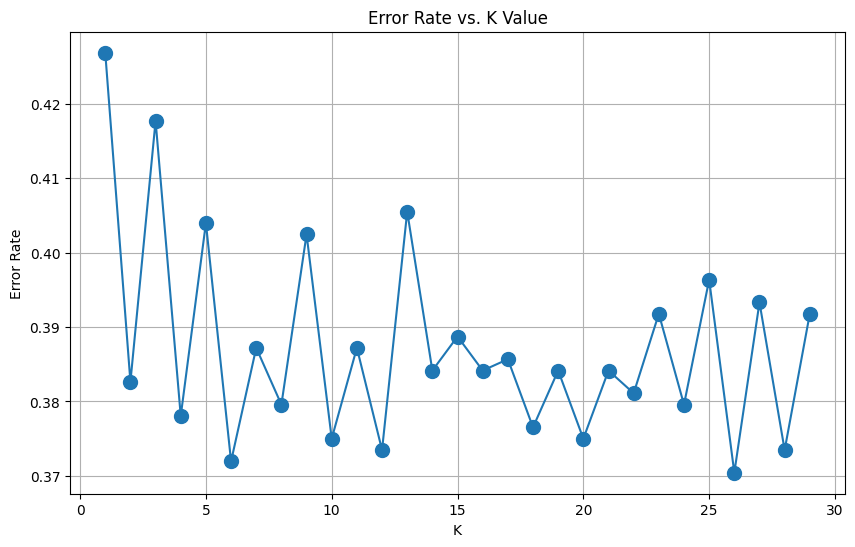

In [32]:
plt.figure(figsize=(10,6))
plt.plot(range(1,30), error_rate, marker='o', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.grid()

In [42]:
min_value = error_rate[0]

for error_value in error_rate:
     if error_value < min_value:
          min_value = error_value

min_index = error_rate.index(min_value)

print("Наименьшее значение было при k = " + str(min_index+1))

Наименьшее значение было при k = 26


In [43]:
knn = KNeighborsClassifier(n_neighbors=min_index+1)

knn.fit(scaled_X_train,y_train)
pred = knn.predict(scaled_X_test)

print(confusion_matrix(y_test,pred))
print()
print(classification_report(y_test,pred))

[[389  26]
 [217  24]]

              precision    recall  f1-score   support

         0.0       0.64      0.94      0.76       415
         1.0       0.48      0.10      0.16       241

    accuracy                           0.63       656
   macro avg       0.56      0.52      0.46       656
weighted avg       0.58      0.63      0.54       656



## Decision Tree

In [44]:
# Проверим какие уникальные значения храняться в переменной "y"
set(y)

{0.0, 1.0}

In [45]:
# Создаём экземпляр класса с параметром "gini", который измеряет вероятность того, что случайно 
# выбранный элемент будет неправильно классифицирован. 
# Gini impurity равно 0, если все элементы в узле принадлежат к одному классу, 
# и равно 0.5 (максимум) в случае равномерного распределения классов.
model = DecisionTreeClassifier(criterion='gini')

In [46]:
model.fit(X_train, y_train)

DecisionTreeClassifier()

### Оцениваем

In [47]:
y_pred = model.predict(X_test)

In [48]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.68      0.65      0.66       415
         1.0       0.43      0.46      0.45       241

    accuracy                           0.58       656
   macro avg       0.55      0.56      0.55       656
weighted avg       0.59      0.58      0.58       656



In [49]:
print(confusion_matrix(y_test, y_pred))

[[270 145]
 [130 111]]


### Визуализируем данные

In [50]:
plt.figure(figsize = (300, 300))
plot_tree(model, feature_names = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity'], class_names = ['0', '1'], filled = True)
plt.show()

## Support Vector Machines

1. **C:** Этот параметр контролирует штраф за ошибки классификации. Значение `C=1.0` указывает на среднюю степень строгости классификации.
2. **gamma:** Этот параметр контролирует ширину ядра для ядерных функций, таких как Radial Basis Function (RBF). Значение `gamma=1.0` указывает на среднюю ширину ядра.
3. **kernel:** Этот параметр определяет тип используемого ядра. Значение `'rbf'` указывает на использование радиально-базисной функции (RBF) в качестве ядра. RBF-ядро часто используется из-за своей универсальности.
4. **cache_size:** Этот параметр определяет размер кэша в мегабайтах (MB), который используется для хранения части матрицы ядра. Значение `cache_size=7000` указывает на установку относительно большого кэша, что может быть полезным для обработки больших объемов данных.

In [51]:
# Создаём экземпяр класса
model = SVC(C=1.0, gamma = 1.0, kernel = 'rbf', cache_size=7000)
model.fit(scaled_X_train,y_train)

SVC(cache_size=7000, gamma=1.0)

In [52]:
y_pred = model.predict(scaled_X_test)

### Оцениваем

In [53]:
print(confusion_matrix(y_test, y_pred))

[[384  31]
 [219  22]]


In [54]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.64      0.93      0.75       415
         1.0       0.42      0.09      0.15       241

    accuracy                           0.62       656
   macro avg       0.53      0.51      0.45       656
weighted avg       0.56      0.62      0.53       656



### Подбираем наилучшие параметры

In [55]:
# Определяем сетку параметров
param_grid = {'C': [0.1, 1, 10, 100, 1000], 'gamma': [1,0.1,0.01,0.001,0.0001], 'kernel': ['rbf']} 

In [56]:
# Выполняем обучение и оценку модели для каждой комбинации значений параметров C, gamma и kernel из заданных списков, 
# то есть поиск по сетке гиперпараметров модели
grid = GridSearchCV(SVC(), param_grid, refit=True)

In [57]:
grid.fit(scaled_X_train,y_train)

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']})

In [58]:
grid.best_params_

{'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}

In [59]:
grid.best_estimator_

SVC(C=1, gamma=0.1)

In [60]:
grid_predictions = grid.predict(scaled_X_test)
print(confusion_matrix(y_test,grid_predictions))

[[396  19]
 [216  25]]


In [61]:
print(classification_report(y_test,grid_predictions))

              precision    recall  f1-score   support

         0.0       0.65      0.95      0.77       415
         1.0       0.57      0.10      0.18       241

    accuracy                           0.64       656
   macro avg       0.61      0.53      0.47       656
weighted avg       0.62      0.64      0.55       656



## Random Forest

1. **max_depth**: определяет максимальную глубину деревьев решений в ансамбле.
2. **random_state**: используется для установки начального значения для генератора случайных чисел. Это влияет на случайный процесс при построении леса, и установка random_state позволяет воспроизводить результаты.
3. **n_estimators**: определяет количество деревьев в лесу.

In [62]:
random_forest = RandomForestClassifier(max_depth=2, random_state=0, n_estimators=200)
random_forest.fit(scaled_X_train, y_train)

RandomForestClassifier(max_depth=2, n_estimators=200, random_state=0)

In [63]:
pred = random_forest.predict(scaled_X_test)

### Оцениваем

In [64]:
print(confusion_matrix(y_test,pred))

[[409   6]
 [237   4]]


In [65]:
print(classification_report(y_test,pred, zero_division=1))

              precision    recall  f1-score   support

         0.0       0.63      0.99      0.77       415
         1.0       0.40      0.02      0.03       241

    accuracy                           0.63       656
   macro avg       0.52      0.50      0.40       656
weighted avg       0.55      0.63      0.50       656



In [66]:
# Отображаем количество более точный процент правильных классификаций
print(accuracy_score(y_test,pred))

0.6295731707317073


### Подбор параметров

In [67]:
error_rate = []

for i in range(1,30):
    random_forest = RandomForestClassifier(max_depth=i, random_state=0, n_estimators=200)
    random_forest.fit(scaled_X_train, y_train)
    pred_i = random_forest.predict(scaled_X_test)
    # Рассчитаем среднее значение ошибки классификациидля текущей максимальной глубины
    error_rate.append(np.mean(pred_i != y_test)) 

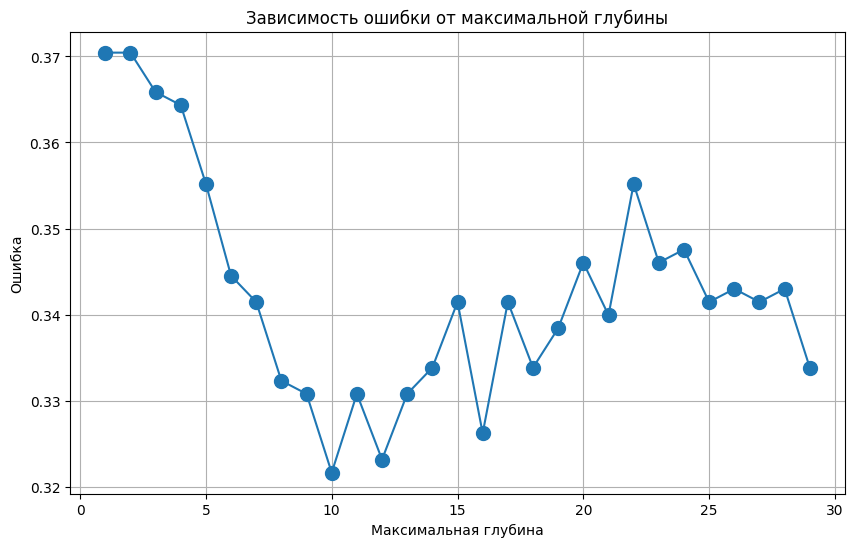

In [68]:
plt.figure(figsize=(10,6))
plt.plot(range(1,30), error_rate, marker='o', markersize=10)
plt.title('Зависимость ошибки от максимальной глубины')
plt.xlabel('Максимальная глубина')
plt.ylabel('Ошибка')
plt.grid()

In [69]:
error_rate = []

for i in range(1,500):
    random_forest = RandomForestClassifier(max_depth=2, random_state=0, n_estimators=i)
    random_forest.fit(scaled_X_train, y_train)
    pred_i = random_forest.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

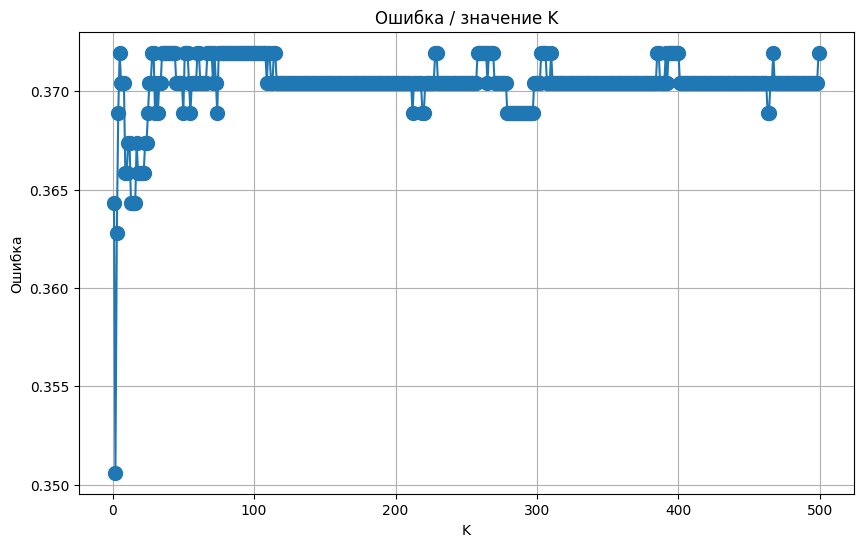

In [70]:
plt.figure(figsize=(10,6))
plt.plot(range(1,500), error_rate, marker='o', markersize=10)
plt.title('Ошибка / значение K')
plt.xlabel('K')
plt.ylabel('Ошибка')
plt.grid()

In [71]:
random_forest = RandomForestClassifier()
random_forest.fit(scaled_X_train, y_train)
pred = random_forest.predict(scaled_X_test)
param_dist = {'n_estimators': randint(50,500),
              'max_depth': randint(1,20)}
rand_search = RandomizedSearchCV(random_forest, 
                                 param_distributions = param_dist, 
                                 n_iter=5, 
                                 cv=5)
print('Наилучшие гиперпараметры:',  rand_search)

print(confusion_matrix(y_test,pred))
print()
print(classification_report(y_test,pred))

Наилучшие гиперпараметры: RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=5,
                   param_distributions={'max_depth': 20, 'n_estimators': 486})
[[354  61]
 [166  75]]

              precision    recall  f1-score   support

         0.0       0.68      0.85      0.76       415
         1.0       0.55      0.31      0.40       241

    accuracy                           0.65       656
   macro avg       0.62      0.58      0.58       656
weighted avg       0.63      0.65      0.63       656



In [72]:
for i in range(3):
    tree = random_forest.estimators_[i]
    dot_data = export_graphviz(tree,
                               feature_names=X_train.columns,  
                               filled=True,  
                               max_depth=2, 
                               impurity=False, 
                               proportion=True)
    graph = graphviz.Source(dot_data)
    display(graph)

ExecutableNotFound: failed to execute WindowsPath('dot'), make sure the Graphviz executables are on your systems' PATH

ExecutableNotFound: failed to execute WindowsPath('dot'), make sure the Graphviz executables are on your systems' PATH

ExecutableNotFound: failed to execute WindowsPath('dot'), make sure the Graphviz executables are on your systems' PATH

## AdaBoost

1. **n_estimators**: количество базовых классификаторов, которые будут использованы в ансамбле.
2. **learning_rate**: коэффициент обучения со значением по-умолчанию равным единице.

In [ ]:
abc = AdaBoostClassifier(n_estimators=50, learning_rate=1)
abc.fit(scaled_X_train, y_train)

In [ ]:
pred = abc.predict(scaled_X_test)

### Оценка

In [ ]:
print(confusion_matrix(y_test,pred))

In [ ]:
print(classification_report(y_test,pred))

In [ ]:
print(accuracy_score(y_test,pred))

### Подбор параметров

In [ ]:
error_rate = []

for i in range(1,50):
    abc = AdaBoostClassifier(n_estimators=i, learning_rate=1)
    abc.fit(scaled_X_train, y_train)
    pred_i = abc.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(range(1,50), error_rate, marker='o', markersize=10)
plt.title('Error Rate vs. N estimators')
plt.xlabel('N estimators')
plt.ylabel('Error Rate')
plt.grid()

In [ ]:
error_rate = []

for i in range(1,20):
    abc = AdaBoostClassifier(n_estimators=5, learning_rate=i)
    abc.fit(scaled_X_train, y_train)
    pred_i = abc.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(range(1,20), error_rate, marker='o', markersize=10)
plt.title('Error Rate vs. Learning_rate')
plt.xlabel('Learning_rate')
plt.ylabel('Error Rate')
plt.grid()

In [ ]:
abc = AdaBoostClassifier(n_estimators=50, learning_rate=1)

abc.fit(scaled_X_train, y_train)
pred = abc.predict(scaled_X_test)

print(confusion_matrix(y_test,pred))
print()
print(classification_report(y_test,pred))